- __Import Libraries__

In [1]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import confusion_matrix, make_scorer
from sklearn.model_selection import cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from termcolor import colored
import matplotlib.colors as mcolors

import warnings
warnings.filterwarnings("ignore")

- __Import data using Pandas__

In [2]:
# read data
df = pd.read_csv('~/Desktop/Work/Python/Cancer-Prediction-ML-Classification/cancerdata.csv')
# data overview
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


- _Shuffle the data_

In [3]:
# shuffle the data because data in series
df = df.sample(frac=1)

# df.iloc[:10]

- _Drop the Unnamed column_

In [ ]:
# drop the unnamed and id columns.
df = df.drop(columns=['Unnamed: 32', 'id'],axis=1)
df.shape

- _Statistical analysis_

In [5]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [6]:
# check for null values in dataset
df.isnull().values.any()

False

In [7]:
# Count class labels
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

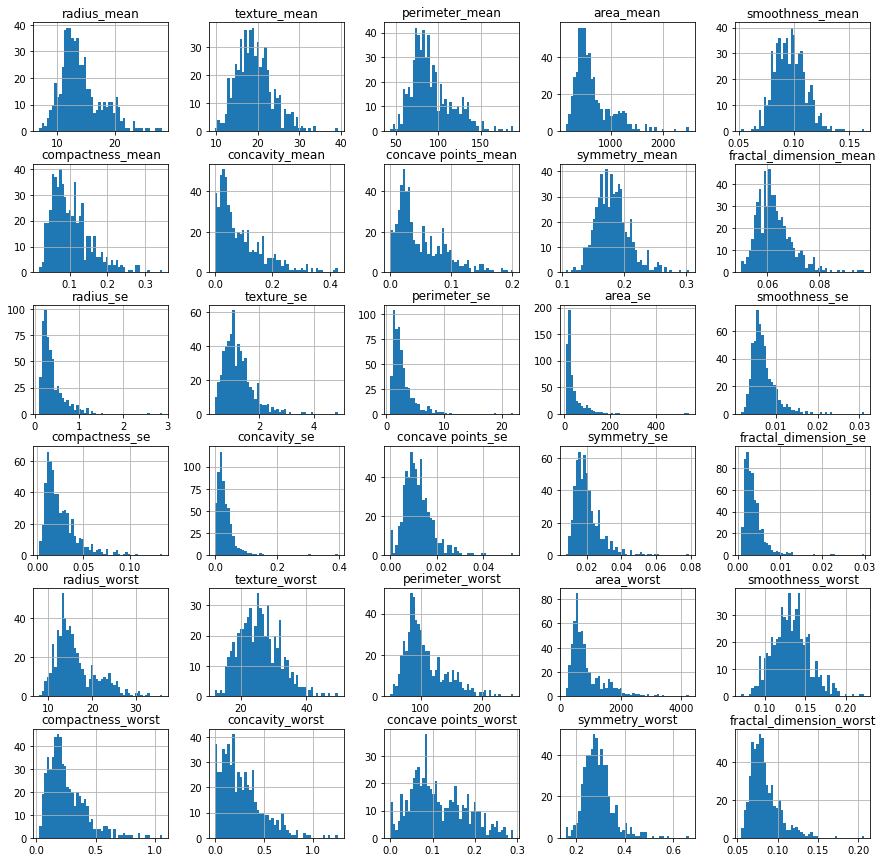

In [8]:
# Data visualization to create histogram
df.hist(bins=50, figsize=(15, 15))
plt.show()

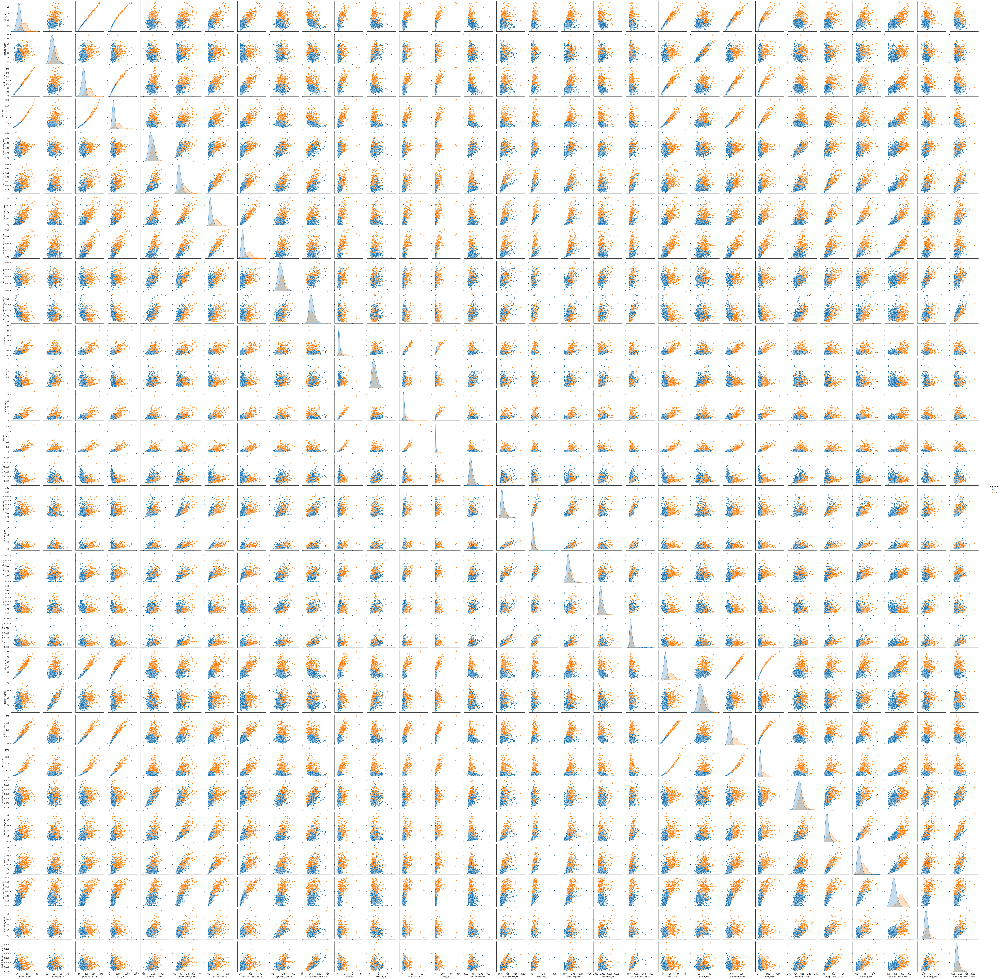

In [11]:
# # Scatter matrix to check correlation between two attributes
# sns.pairplot(df, hue='diagnosis')

(-1.25, 1.25, -1.25, 1.25)

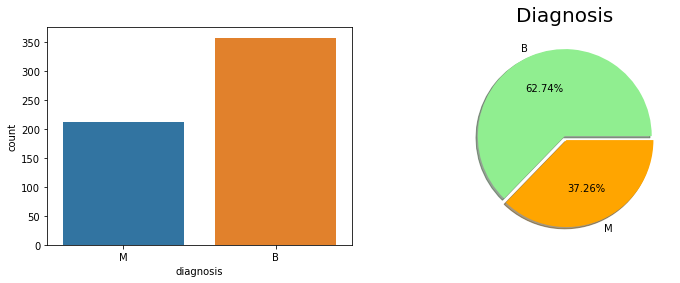

In [9]:
fig, axes = plt.subplots(1,2,figsize=(12,4))

# sns.countplot(y='diagnosis', data=df, palette='Set2',ax=axes[0])
sns.countplot(df['diagnosis'],label="Count",ax=axes[0])

labels = ['B', 'M']
size = df['diagnosis'].value_counts()
colors = ['lightgreen', 'orange']
explode = [0, 0.05]
# plt.rcParams['figure.figsize'] = (7, 7)
plt.pie(size, colors = colors, explode = explode, labels = labels, shadow = True, autopct = '%.2f%%')
plt.title('Diagnosis', fontsize = 20)
plt.axis('off')

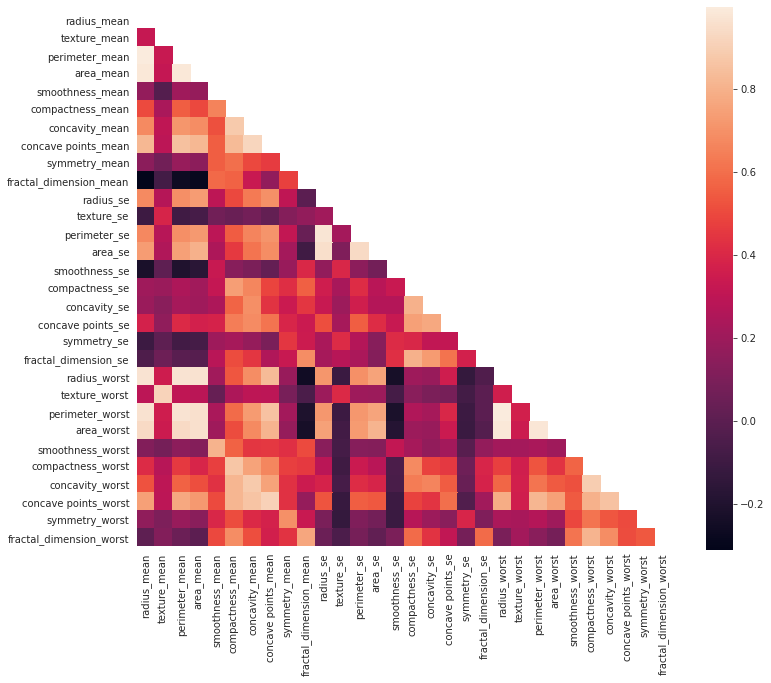

In [10]:
# Finding correlation
corr = df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    fig, ax = plt.subplots(figsize=(12, 10))
    sns.heatmap(corr, ax=ax,mask=mask,square=True)

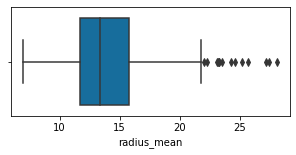

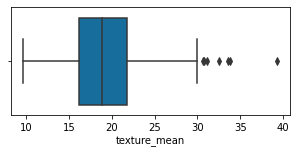

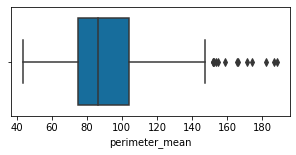

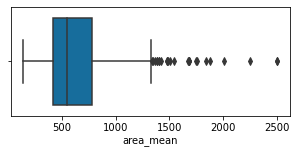

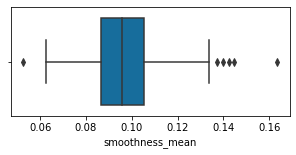

...

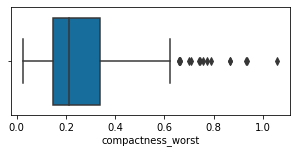

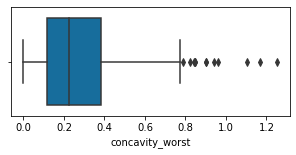

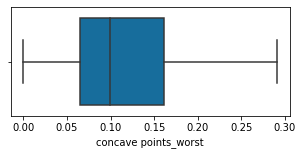

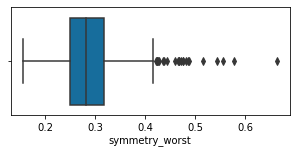

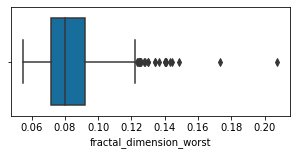

In [11]:
# box plot to check outlier in each category
def boxPlot(dff):
    d = dff.drop(columns=['diagnosis'])
    for column in d:
        plt.figure(figsize=(5, 2))
        sns.boxplot(x=column, data=d, palette="colorblind")

boxPlot(df)

In [12]:
# Quartile range

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
inter_quartile_range = Q3 - Q1

# quartiles and interquartile range

df_out = df[~((df < (Q1 - (1.5 * inter_quartile_range))) | (df > (Q3 + (1.5 * inter_quartile_range)))).any(axis=1)]
df.shape, df_out.shape


((569, 31), (398, 31))

In [13]:
# Separate labels and features
X = df_out.drop(columns=['diagnosis'])
y = df_out['diagnosis']

In [14]:
# Convert the M to 1 and B to 0
label = LabelEncoder()
y = label.fit_transform(y)
y[:20]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [15]:
# Spilt the train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
# we used 30% test data
# check the size before beginning
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((278, 30), (120, 30), (278,), (120,))

In [16]:
# cross validation function
def tn(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[0, 0]


def fp(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[0, 1]


def fn(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[1, 0]


def tp(y_true, y_pred):
    return confusion_matrix(y_true, y_pred)[1, 1]


def acc(y_true, y_pred):
    return accuracy(y_true, y_pred)


# custom accuracy
def accuracy(y_true, y_pred):
    cnf_matrix = confusion_matrix(y_true, y_pred)
    N = sum(map(sum, cnf_matrix))
    tp = cnf_matrix[1, 1]
    tn = cnf_matrix[0, 0]
    return round((tp + tn) / N, 2)


In [17]:
# cross validation purpose
scoring = {'accuracy': make_scorer(metrics.accuracy_score), 'prec': 'precision'}
scoring = {'tp': make_scorer(tp), 'tn': make_scorer(tn),
           'fp': make_scorer(fp), 'fn': make_scorer(fn),
           'acc': make_scorer(acc)}

In [18]:
def print_result(result):
    print("True Positive: ", result['test_tp'])
    print("True Negative: ", result['test_tn'])
    print("False Negative: ", result['test_fn'])
    print("False Positive: ", result['test_fp'])
    print("Accuracy: ", result['test_acc'])


##### Model: Naive Bayes (NB)

In [19]:
# storing each model accuracy and Receiver Operating Characteristic (ROC)
acc = []
roc = []

# Naive Bayes
model = GaussianNB()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)
print(colored("Naive Bayes (NB) :" ,"green", attrs=['bold']))
print("Training Set Accuracy : ", colored(ac_train,"red"))
print("Test Accuracy: {0}".format(ac))
print("Receiver Operating Characteristics (ROC): ",colored(rc,"red"))

Naive Bayes (NB) :
Training Set Accuracy :  0.9424460431654677
Test Accuracy: 0.9416666666666667
Receiver Operating Characteristics (ROC):  0.9210310965630115


In [20]:
# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

True Positive:  [6 7 7 6 6 6 7 8 7 7]
True Negative:  [21 17 21 20 19 18 19 20 19 20]
False Negative:  [1 0 0 1 1 1 1 0 0 0]
False Positive:  [0 4 0 1 2 3 1 0 1 0]
Accuracy:  [0.96 0.86 1.   0.93 0.89 0.86 0.93 1.   0.96 1.  ]


#### Model: Logistic Regression (LR)

In [21]:
# Logistic Regression
LR = LogisticRegression()
LR.fit(X_train, y_train)
LR.score(X_train, y_train)
y_pred = LR.predict(X_test)
y_pred_train = model.predict(X_train)

# find accuracy
ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
# Code for ROC_AUC curve
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)

print(colored("Logistic Regression (LR) :" ,"blue", attrs=['bold']))
print("Training Set Accuracy : ", colored(ac_train,"red"))
print("Test Accuracy: {0}".format(ac))
print("Receiver Operating Characteristics (ROC): ",colored(rc,"red"))

Logistic Regression (LR) :
Training Set Accuracy :  0.9424460431654677
Test Accuracy: 0.95
Receiver Operating Characteristics (ROC):  0.8985270049099837


In [22]:
# cross validation shows how accurate our model is
result = cross_validate(LR, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

True Positive:  [6 6 6 6 6 4 7 8 7 5]
True Negative:  [21 20 20 21 19 20 18 20 20 20]
False Negative:  [1 1 1 1 1 3 1 0 0 2]
False Positive:  [0 1 1 0 2 1 2 0 0 0]
Accuracy:  [0.96 0.93 0.93 0.96 0.89 0.86 0.89 1.   1.   0.93]


#### Support Vector Machine (SVM)

In [23]:
# Support Vector Machine
model = SVC(gamma='auto', kernel='linear')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)

print(colored("Support Vector Machine (SVM) :" ,"yellow", attrs=['bold']))
print("Training Set Accuracy : ", colored(ac_train,"red"))
print("Test Accuracy: {0}".format(ac))
print("Receiver Operating Characteristics (ROC): ",colored(rc,"red"))

Support Vector Machine (SVM) :
Training Set Accuracy :  0.9676258992805755
Test Accuracy: 0.9583333333333334
Receiver Operating Characteristics (ROC):  0.917757774140753


In [24]:
# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

True Positive:  [6 6 5 6 6 3 7 7 7 5]
True Negative:  [21 20 21 21 21 20 19 20 19 20]
False Negative:  [1 1 2 1 1 4 1 1 0 2]
False Positive:  [0 1 0 0 0 1 1 0 1 0]
Accuracy:  [0.96 0.93 0.93 0.96 0.96 0.82 0.93 0.96 0.96 0.93]


#### K Nearest Neighbors (KNN)

In [25]:
# KNN
model = KNeighborsClassifier(n_neighbors=9, n_jobs=-1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)

print(colored("K Nearest Neighbors (KNN) :" ,color="red", attrs=['bold']))
print("Training Set Accuracy : ", colored(ac_train,"red"))
print("Test Accuracy: {0}".format(ac))
print("Receiver Operating Characteristics (ROC): ",colored(rc,"red"))

K Nearest Neighbors (KNN) :
Training Set Accuracy :  0.9244604316546763
Test Accuracy: 0.9666666666666667
Receiver Operating Characteristics (ROC):  0.9230769230769231


In [26]:
# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)

True Positive:  [4 5 5 6 6 4 7 8 7 5]
True Negative:  [21 21 20 21 20 20 18 20 18 20]
False Negative:  [3 2 2 1 1 3 1 0 0 2]
False Positive:  [0 0 1 0 1 1 2 0 2 0]
Accuracy:  [0.89 0.93 0.89 0.96 0.93 0.86 0.89 1.   0.93 0.93]


#### Random Forest (RF)

In [27]:
# Random Forest
model = RandomForestClassifier(n_estimators=20, max_depth=10)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

ac = accuracy_score(y_test, y_pred)
acc.append(ac)
ac_train = accuracy_score(y_train, y_pred_train)
rc = roc_auc_score(y_test, y_pred)
roc.append(rc)

print(colored("Random Forest (RF) :" ,color="blue", attrs=['bold']))
print("Training Set Accuracy : ", colored(ac_train,"red"))
print("Test Accuracy: {0}".format(ac))
print("Receiver Operating Characteristics (ROC): ",colored(rc,"red"))

Random Forest (RF) :
Training Set Accuracy :  1.0
Test Accuracy: 0.95
Receiver Operating Characteristics (ROC):  0.8846153846153846


In [28]:
# cross validation
result = cross_validate(model, X_train, y_train, scoring=scoring, cv=10)
print_result(result)


True Positive:  [6 7 6 6 5 5 7 7 7 4]
True Negative:  [21 21 21 21 21 20 19 20 20 20]
False Negative:  [1 0 1 1 2 2 1 1 0 3]
False Positive:  [0 0 0 0 0 1 1 0 0 0]
Accuracy:  [0.96 1.   0.96 0.96 0.93 0.89 0.93 0.96 1.   0.89]


Text(0.5, 0, 'Algortihms')

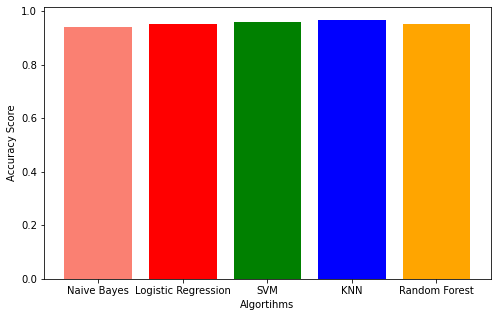

In [33]:
# Plot the bar graph for accuracy and  roc-auc
# accuracy score
plt.figure(figsize=(8, 5))
plt.bar(['Naive Bayes','Logistic Regression', 'SVM', 'KNN', 'Random Forest'], acc,
        color=['salmon', 'r', 'g', 'b', 'orange'], label='Accuracy')
plt.ylabel('Accuracy Score')
plt.xlabel('Algortihms')

In [35]:
res_data = {'Model': ['Naive Bayes','Logistic Regression','Support Vector Machine','K Neareset Neighbors','Random Forest'],
           'Accuracy':['0.9417','0.95','0.9583','0.9667','0.95'],
           'ROC': ['0.92103','0.8985','0.9178','0.9231','0.8846']}
labels = ['a','b','c','d','e']
res_df = pd.DataFrame(res_data, index=labels)
res_df

,Model,Accuracy,ROC
a,Naive Bayes,0.9417,0.92103
b,Logistic Regression,0.95,0.8985
c,Support Vector Machine,0.9583,0.9178
d,K Neareset Neighbors,0.9667,0.9231
e,Random Forest,0.95,0.8846


Text(0.5, 0, 'Model')

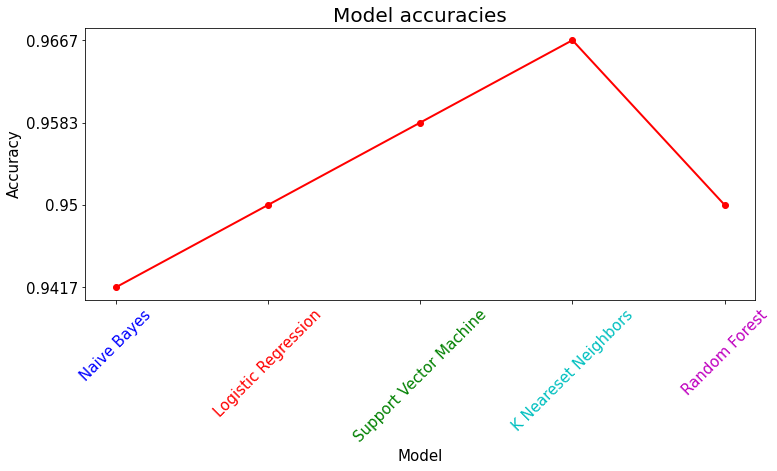

In [49]:
#Accuracy and ROC 
# plt.figure(figsize=(8,5))
fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(111)
xval = res_df.Model
yval = res_df.Accuracy
plt.xticks(fontsize=15,rotation = 45)
plt.yticks(fontsize=15)
line1,=plt.plot(xval,yval,marker='o',linewidth=2,color='red',label='Acc')
# line2,=plt.plot(res_df.Model,res_df.ROC,marker='o',linewidth=2,color='blue',label='ROC')
# plt.ylim([0.7, 0.99])

xlabs = res_df.Model
ax.set_xticklabels(xlabs, rotation=45)

colors = ['b', 'r', 'g','c','m']
for xtick, color in zip(ax.get_xticklabels(), colors):
    xtick.set_color(color)
    
plt.title("Model accuracies",fontsize=20)
plt.ylabel('Accuracy',fontsize=15)
plt.xlabel('Model',fontsize=15)
# ax.legend(loc='upper left', frameon=False,fontsize=15)
